In [ ]:


import matplotlib.pyplot as plt

from src.utils import load_facial_classifier

# plt.style.use('dark_background')

plot_path = "../data_file/spray.png"
plt.imshow(plt.imread(plot_path))
plt.axis('off')
plt.show()

In [2]:
from lrpspray import *
data_source = "dataset"

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
sut = load_facial_classifier(sut_facial_path, device)

# Step 1: Generate relevance maps for the dataset
relevance_maps = []
image_ids = []
if data_source == "generated":
    generator = load_generator(gan_facial_ckpt_path, device)
    for torch_seed in range(100):
        torch.manual_seed(torch_seed)
        # generate one random seed from z latent space
        z = torch.randn([1, generator.z_dim], device=device)
        img_tensor =  generator(z, c=None, truncation_psi=1, noise_mode='const')
        img_tensor = (img_tensor.clamp(-1, 1) + 1) / 2
        if img_tensor.dim() == 3:
            img_tensor = img_tensor.unsqueeze(0)
        if sut(img_tensor).squeeze()[15] > 0:
            relevance_np = generate_relevance_maps(sut, img_tensor,
                                                   target_logit=15,
                                                   composite_config={"low": -3.0, "high": 3.0}
                                                   )
            relevance_maps.append(relevance_np)
            image_ids.append(torch_seed)
elif data_source == "dataset":

    dataset = CelebADataset(root=dataset_path,
                          transform=None,  # use default
                          split='test'
                          )
    for id, (img_tensor, _ )in enumerate(dataset):

        img_tensor = img_tensor.to(device)
        if img_tensor.dim() == 3:
            img_tensor = img_tensor.unsqueeze(0)
        if sut(img_tensor).squeeze()[15] > 0:
            relevance_np = generate_relevance_maps(sut, img_tensor,
                                                   target_logit=15,
                                                   composite_config={"low": -3.0, "high": 3.0}
                                                   )
            relevance_maps.append(relevance_np)
            image_ids.append(id)
# Step 2: Preprocess relevance maps (normalization and downsizing)
processed_maps = preprocess_relevance_maps(relevance_maps)


/home/xchen/.conda/envs/stylegan3/lib/python3.9/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/xchen/.conda/envs/stylegan3/lib/python3.9/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/xchen/.conda/envs/stylegan3/lib/python3.9/site-packages/torch/autograd/graph.py:768: UserWarning: Attempting to run cuBLAS, but there was no current CUDA context! Attempting to set the primary context... (Triggered internally at ../aten/src/ATen/cuda/CublasHandlePool.cpp:135.)
  return Variable._execution_engine.run_backward(

In [8]:
from sklearn.neighbors import kneighbors_graph
from scipy.linalg import eigh

def eigengap_analysis(processed_maps, k_max=10):
    """
    Perform eigengap analysis to determine optimal number of clusters.

    Returns:
        optimal_k (int), eigvals (array)
    """
    # Step 1: Compute affinity matrix using k-nearest neighbors graph
    connectivity = kneighbors_graph(processed_maps, n_neighbors=10, include_self=True)
    A = 0.5 * (connectivity.toarray() + connectivity.toarray().T)

    # Step 2: Compute unnormalized Laplacian L = D - A
    D = np.diag(A.sum(axis=1))
    L = D - A

    # Step 3: Compute eigenvalues
    eigvals, _ = eigh(L)
    eigvals = np.real(eigvals[:k_max])  # only first k_max eigenvalues

    # Step 4: Find largest eigengap
    gaps = np.diff(eigvals)
    optimal_k = np.argmax(gaps) + 1
    return optimal_k, eigvals

# Step new 3: Eigengap analysis
optimal_k, eigvals = eigengap_analysis(processed_maps)
print(f"Optimal number of clusters (eigengap): {optimal_k}")

# Step new 4: Spectral clustering using this k
labels = perform_spectral_clustering(processed_maps, num_clusters=optimal_k)

# old Step 3: Perform Spectral Clustering on processed relevance maps
#labels = perform_spectral_clustering(processed_maps, num_clusters=5)

save_cluster_info(image_ids, labels, output_file="cluster_info.csv")


Optimal number of clusters (eigengap): 9
Cluster information saved to: cluster_info.csv


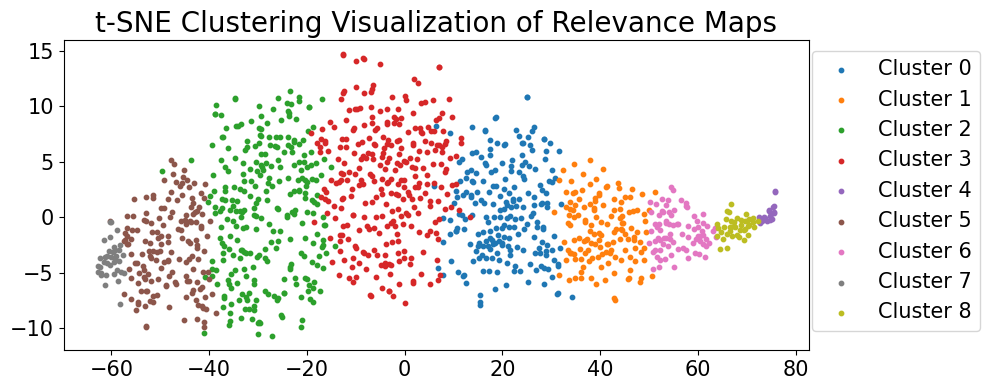

In [46]:
# visualize_clusters(processed_maps, labels)
plt.style.use('default')
num_samples = 10000
"""
Visualize the clustering results using t-SNE.

Parameters:
    processed_maps: Processed relevance maps as input to t-SNE.
    labels: Cluster labels for each relevance map.
    num_samples: Number of samples to visualize.

Returns:
    None. Displays the t-SNE plot.
"""
tsne = TSNE(n_components=2, perplexity=30, random_state=42)
maps_subset = processed_maps[:num_samples]
label_subset = labels[:num_samples]
reduced_maps = tsne.fit_transform(maps_subset)

plt.figure(figsize=(10, 4))
for label in np.unique(label_subset):
    plt.scatter(
        reduced_maps[label_subset == label, 0],
        reduced_maps[label_subset == label, 1],
        label=f'Cluster {label}',
        s=10
    )
plt.grid(False)
plt.legend(bbox_to_anchor=(0.99, 1), loc='upper left', fontsize=15)
plt.tick_params(axis='x', labelsize=15)
plt.tick_params(axis='y', labelsize=15)
plt.title("t-SNE Clustering Visualization of Relevance Maps", fontsize=20)
plt.tight_layout()
plt.savefig('spray_tsne.svg', format='svg', dpi=300, bbox_inches='tight')
plt.show()


In [9]:
import os
os.chdir('..')
print(os.getcwd())

/tmp/pycharm_project_181


In [15]:
df = pd.read_csv("cluster_info.csv")
df

,Image_ID,Cluster_Label
0,9,0
1,10,2
2,24,3
3,33,3
4,35,0
...,...,...
1267,19903,1
1268,19930,1
1269,19950,8
1270,19952,3


/home/xchen/.conda/envs/stylegan3/lib/python3.9/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/xchen/.conda/envs/stylegan3/lib/python3.9/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/home/xchen/.conda/envs/stylegan3/lib/python3.9/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/xchen/.conda/envs/stylegan3/lib/python3.9/site-packages/torchvision/models/_utils.py:

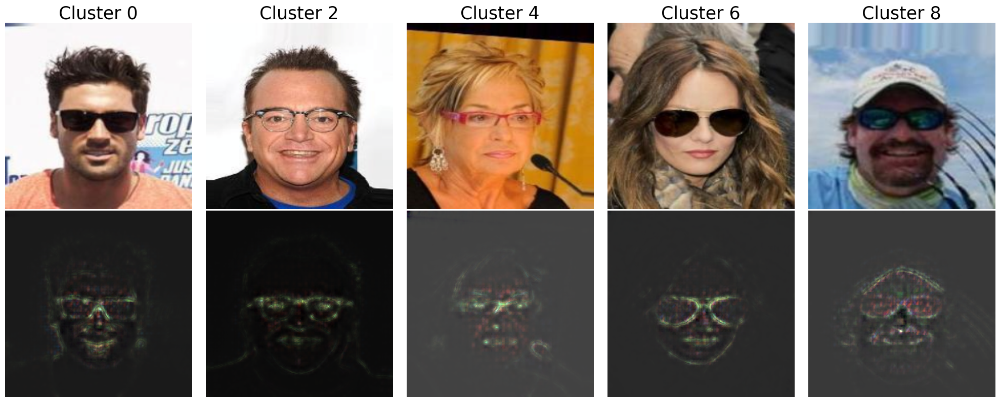

In [40]:
fig, axes = plt.subplots(2, 5,figsize=(20, 8))
rowid = [0,2,4,4,4]
for idx, cluster_id in enumerate([0,2,4,6,8]):
    row = df[df["Cluster_Label"] == cluster_id].iloc[rowid[idx]]

    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
    sut = load_facial_classifier(sut_facial_path, device)
    dataset = CelebADataset(root=dataset_path,
                            transform=None,  # use default
                            split='test'
                            )
    axes = axes.ravel()

    img_id = row['Image_ID']
    (img_tensor, _) = dataset[img_id]
    img_tensor = img_tensor.to(device)
    if img_tensor.dim() == 3:
        img_tensor = img_tensor.unsqueeze(0)
    relevance_map = generate_relevance_maps(sut, img_tensor,
                                            target_logit=15,
                                            composite_config={"low": -3.0, "high": 3.0}
                                            )
    relevance_map = np.transpose(relevance_map, (1, 2, 0))
    # Normalize relevance map to [0, 1]
    normalized_map = (relevance_map - relevance_map.min()) / (
            relevance_map.max() - relevance_map.min() + 1e-8)

    img = img_tensor.cpu().detach().numpy()[0]

    # Denormalize the image
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    img = img.transpose(1, 2, 0)
    img = img * std + mean
    img = np.clip(img, 0, 1)

    axes[idx].imshow(img)
    axes[idx].axis('off')
    axes[idx].set_title(f"Cluster {cluster_id}", fontsize=25)
    axes[idx + 5].imshow(normalized_map)
    axes[idx + 5].axis('off')

plt.tight_layout()
plt.savefig("spary_example.png")
plt.show()


In [19]:
def plot_images(cluster_id):
    cluster_data = df[df["Cluster_Label"] == cluster_id]
    cluster_data = cluster_data.head(10)

    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
    sut = load_facial_classifier(sut_facial_path, device)
    dataset = CelebADataset(root=dataset_path,
                            transform=None,  # use default
                            split='test'
                            )
    fig, axes = plt.subplots(5, 4, figsize=(15, 20))
    axes = axes.ravel()
    for idx, (_, row) in enumerate(cluster_data.iterrows()):
        img_id = row['Image_ID']
        (img_tensor, _) = dataset[img_id]
        img_tensor = img_tensor.to(device)
        if img_tensor.dim() == 3:
            img_tensor = img_tensor.unsqueeze(0)
        relevance_map = generate_relevance_maps(sut, img_tensor,
                                                target_logit=15,
                                                composite_config={"low": -3.0, "high": 3.0}
                                                )
        relevance_map = np.transpose(relevance_map, (1, 2, 0))
        # Normalize relevance map to [0, 1]
        normalized_map = (relevance_map - relevance_map.min()) / (
                relevance_map.max() - relevance_map.min() + 1e-8)

        img = img_tensor.cpu().detach().numpy()[0]

        # Denormalize the image
        mean = np.array([0.485, 0.456, 0.406])
        std = np.array([0.229, 0.224, 0.225])
        img = img.transpose(1, 2, 0)
        img = img * std + mean
        img = np.clip(img, 0, 1)

        axes[2 * idx].imshow(img)
        axes[2 * idx].axis('off')
        axes[2 * idx + 1].imshow(normalized_map)
        axes[2 * idx + 1].axis('off')
    plt.tight_layout()
    plt.show()


/home/xchen/.conda/envs/stylegan3/lib/python3.9/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/xchen/.conda/envs/stylegan3/lib/python3.9/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


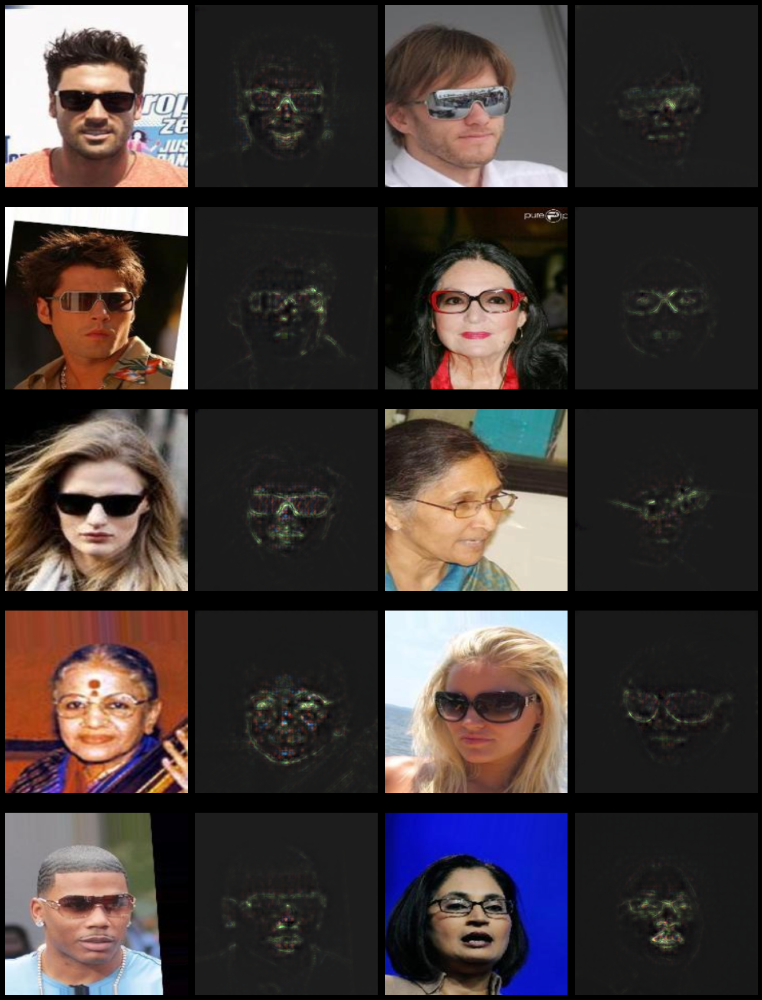

In [20]:
plot_images(0)

/home/xchen/.conda/envs/stylegan3/lib/python3.9/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/xchen/.conda/envs/stylegan3/lib/python3.9/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


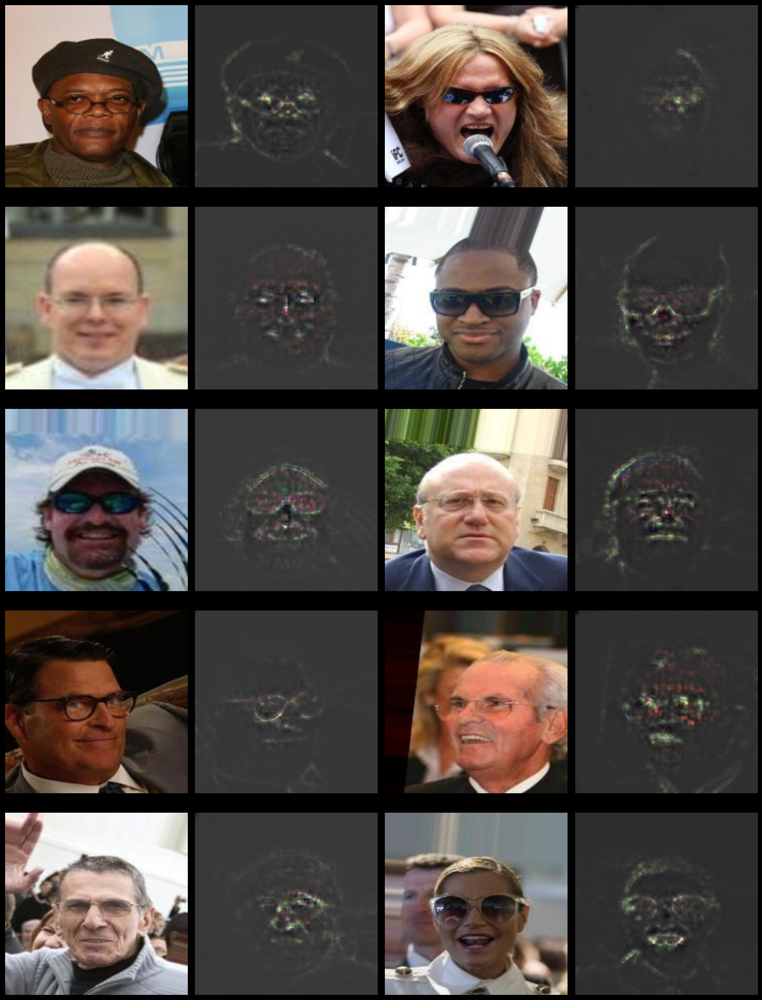

In [18]:
plot_images(8)

/home/xchen/.conda/envs/stylegan3/lib/python3.9/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/xchen/.conda/envs/stylegan3/lib/python3.9/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


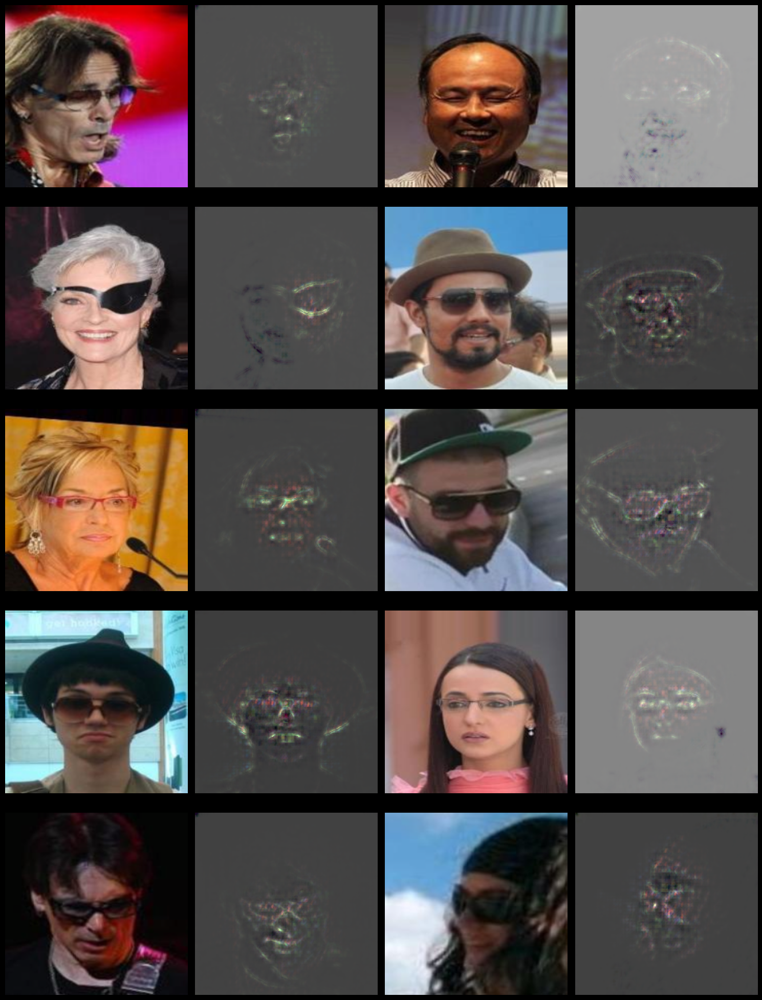

In [6]:
plot_images(2)

/home/xchen/.conda/envs/stylegan3/lib/python3.9/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/xchen/.conda/envs/stylegan3/lib/python3.9/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


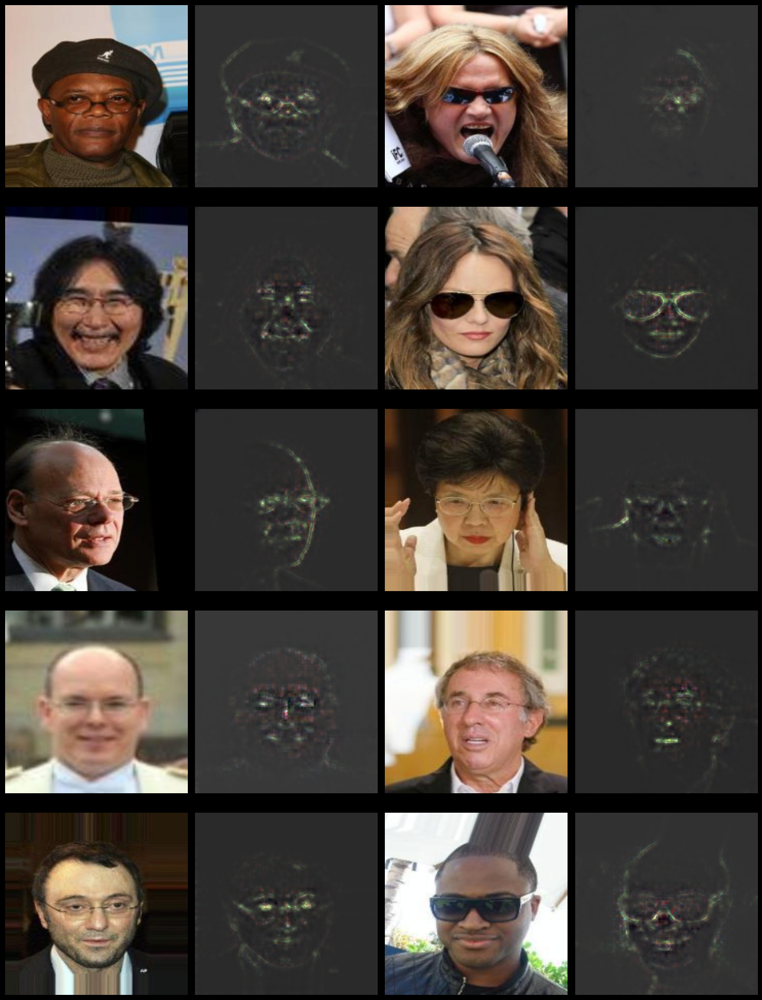

In [7]:
plot_images(3)

/home/xchen/.conda/envs/stylegan3/lib/python3.9/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/xchen/.conda/envs/stylegan3/lib/python3.9/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


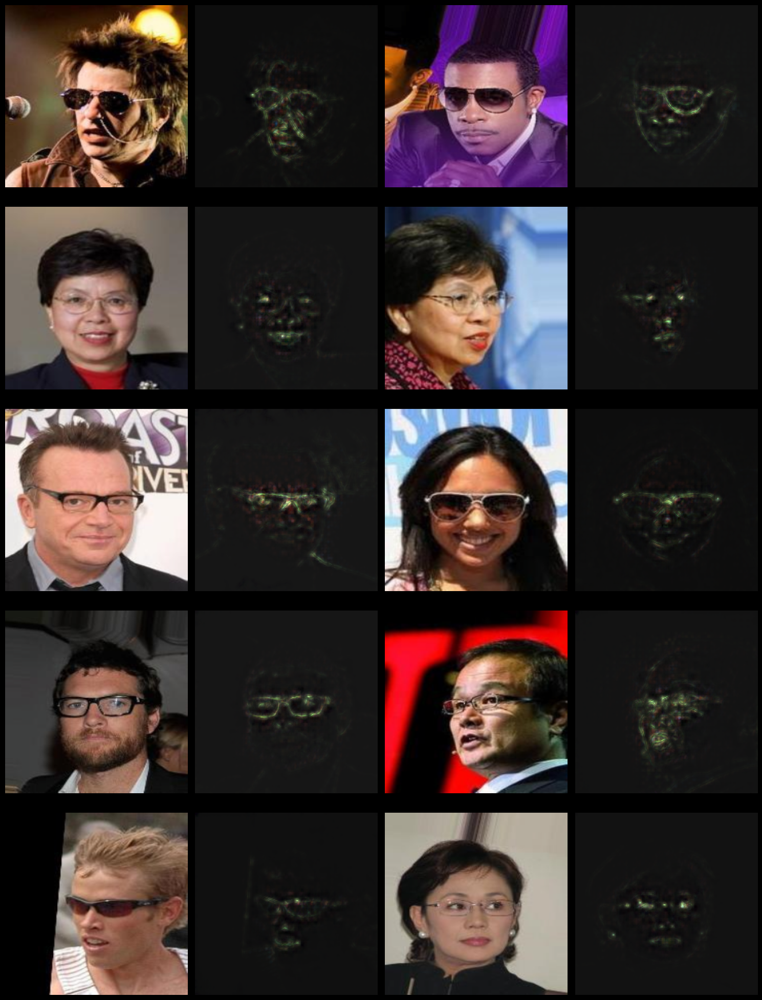

In [8]:
plot_images(4)